In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import xarray as xr
import numpy as np
from natsort import natsorted
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import pickle

In [3]:
import sys
original_path = os.getcwd()  
os.chdir(original_path)
function_path = './functions/'
sys.path.append(function_path)
from model_analysis_function import *
from analysis_function import *
from obs_function import *

save_path = '/Users/tongli1997/Library/CloudStorage/OneDrive-UniversityofVictoria/Codes_run_on_local/Global_regional_attribution/Dec_2025/saved_data/'

In [4]:
import glob

path = '/Volumes/Backup Plus/Global_regional_attribution/input_data/model_data/'
os.chdir(path)

# Run for a folder
mo_his_all = cal_for_scenario('his-ALL-year_5deg/*.nc', function=mod_all_process)
mo_ssp5_all = cal_for_scenario('ssp585-ALL-year_5deg/*.nc', function=mod_all_process)
mo_his_ghg = cal_for_scenario('his-GHG-year_5deg/*.nc', function = mod_DA_process)
mo_his_nat = cal_for_scenario('his-nat-year_5deg/*.nc', function = mod_DA_process)


mo_ssp2_ghg = cal_for_scenario('ssp245-GHG-year_5deg/*.nc', function = mod_DA_ssp2_process)
mo_ssp2_nat = cal_for_scenario('ssp245-nat-year_5deg/*.nc', function = mod_DA_ssp2_process)



Processing: tas_historical_ACCESS-CM2_run1_glob_grid_yr_1850_2020.nc
Processing: tas_historical_ACCESS-CM2_run2_glob_grid_yr_1850_2020.nc
Processing: tas_historical_ACCESS-CM2_run3_glob_grid_yr_1850_2020.nc
Processing: tas_historical_ACCESS-ESM1-5_run1_glob_grid_yr_1850_2020.nc
Processing: tas_historical_ACCESS-ESM1-5_run2_glob_grid_yr_1850_2020.nc
Processing: tas_historical_ACCESS-ESM1-5_run3_glob_grid_yr_1850_2020.nc
Processing: tas_historical_ACCESS-ESM1-5_run4_glob_grid_yr_1850_2020.nc
Processing: tas_historical_ACCESS-ESM1-5_run5_glob_grid_yr_1850_2020.nc
Processing: tas_historical_ACCESS-ESM1-5_run6_glob_grid_yr_1850_2020.nc
Processing: tas_historical_ACCESS-ESM1-5_run7_glob_grid_yr_1850_2020.nc
Processing: tas_historical_ACCESS-ESM1-5_run8_glob_grid_yr_1850_2020.nc
Processing: tas_historical_ACCESS-ESM1-5_run9_glob_grid_yr_1850_2020.nc
Processing: tas_historical_ACCESS-ESM1-5_run10_glob_grid_yr_1850_2020.nc
Processing: tas_historical_ACCESS-ESM1-5_run11_glob_grid_yr_1850_2020.nc

In [5]:
### Calculate 
mo_ssp5_all_anom = mo_ssp5_all- mo_his_all.sel(time = slice(1961,1990)).mean('time')
mo_his_all_anom = mo_his_all - mo_his_all.sel(time = slice(1961,1990)).mean('time')
mo_his_all_anom = mo_his_all_anom.sel(model_run=mo_ssp5_all_anom['model_run'])
mo_all_his_fu = xr.concat([mo_his_all_anom,mo_ssp5_all_anom], dim = 'time').rename({'time': 'year'})

### Combine with CESM2, MIROC-ES2L, MPI-ESM1-2-LR

In [6]:
### First drop the incomplete runs of the two models
drop_models = ["MIROC-ES2L", "MPI-ESM1-2-LR"]
mo_all_his_fu_filtered = mo_all_his_fu.sel(model_run=~mo_all_his_fu.model_name.isin(drop_models))

### Get all of them from large ensembles
file_path = '/Volumes/Backup Plus/Global_regional_attribution/input_data/'
file_name = '0.6large_ensembles.320runs.1850-2100.2.5deg.Grids.Anom.1961-1990.pkl'

ln_grid = pd.read_pickle(file_path + file_name).rename({'time':'year'})

ln_cesm = ln_grid.sel(model_run=ln_grid.model_name == "CESM2")
ln_miroc = ln_grid.sel(model_run=ln_grid.model_name == "MIROC-ES2L")
ln_mpi = ln_grid.sel(model_run=ln_grid.model_name == "MPI-ESM1-2-LR")
mod_all = xr.concat([mo_all_his_fu_filtered, ln_cesm, ln_miroc, ln_mpi], dim = 'model_run')

mod_all = sort_model_run_naturally(mod_all, coord_name="model_run")

### Calculate the AR6, continent, global land mean

In [7]:
import re

def convert_run_to_r_format(name):
    # Match model name and run number from 'Model_runX'
    match = re.match(r'(.+?)_run(\d+)', name)
    if match:
        model_name = match.group(1)
        run_number = match.group(2)
        return f'{model_name}_r{run_number}i1p1f1'
    else:
        return name  # Leave unchanged if it doesn't match the pattern

mo_his_all = mod_all.sel(year = slice(1850, 2020))

mo_his_all = mo_his_all.assign_coords(
    model_run=("model_run", [convert_run_to_r_format(name) for name in mo_his_all['model_run'].values])
)

mo_his_ant = mo_his_all - mo_his_nat ### 11 models, 97 runs
mo_his_oa = mo_his_ant - mo_his_ghg  ### 10 models, 96 runs

def count_model_runs_table(*datasets, names):
    import pandas as pd
    counts_list = []
    for ds in datasets:
        counts = pd.Series(ds['model_name'].values).value_counts().sort_index()
        counts_list.append(counts)

    combined = pd.concat(counts_list, axis=1)
    combined.columns = names
    return combined.fillna(0).astype(int).sort_index()

table = count_model_runs_table(
    mo_his_all, mo_his_ant, mo_his_nat, mo_his_ghg, mo_his_oa,
    names=["hist-ssp245-ALL", "hist-ANT", "hist-NAT", "hist-GHG", "hist-OA"]
)

total_row = table.sum(axis=0)   # sum each column
table.loc["Total"] = total_row

table.to_csv(save_path + "model_run_counts.csv")
table

,hist-ssp245-ALL,hist-ANT,hist-NAT,hist-GHG,hist-OA
ACCESS-CM2,3,3,3,3,3
ACCESS-ESM1-5,40,3,3,3,3
BCC-CSM2-MR,1,1,3,3,1
CESM2,100,0,3,3,0
CMCC-ESM2,1,0,0,0,0
CNRM-CM6-1,6,0,10,10,0
CNRM-ESM2-1,4,0,0,0,0
CanESM5,50,25,50,50,25
E3SM-1-0,0,0,0,3,0
E3SM-2-0,0,0,0,5,0


In [8]:
mo_his_all_mean = mo_his_all.groupby('model_name').mean() ## 25 mod
mo_his_ant_mean = mo_his_ant.groupby('model_name').mean() ## 11 mod
mo_his_nat_mean = mo_his_nat.groupby('model_name').mean() ## 15 mod
mo_his_ghg_mean = mo_his_ghg.groupby('model_name').mean() ##16 mod
mo_his_oa_mean  = mo_his_oa.groupby('model_name').mean() ## 10 mod


mo_his_ant_mean = mo_his_ant_mean + mo_his_oa_mean - mo_his_oa_mean ## 10 mod
mo_his_nat_mean = mo_his_nat_mean + mo_his_oa_mean - mo_his_oa_mean ## 10 mod
mo_his_ghg_mean = mo_his_ghg_mean + mo_his_oa_mean - mo_his_oa_mean ## 10 mod

In [9]:
mod_his_all_ar6_cont_global = mod_runs_ar6_cont_glob_cal(mo_his_all_mean)
print('ALL, done')
mo_his_ant_ar6_cont_global = mod_runs_ar6_cont_glob_cal(mo_his_ant_mean)
print('ant, done')
mo_his_nat_ar6_cont_global = mod_runs_ar6_cont_glob_cal(mo_his_nat_mean)
print('nat, done')
mo_his_ghg_ar6_cont_global = mod_runs_ar6_cont_glob_cal(mo_his_ghg_mean)
print('ghg, done')
mo_his_oa_ar6_cont_global = mod_runs_ar6_cont_glob_cal(mo_his_oa_mean)
print('oa, done')

ALL, done
ant, done
nat, done
ghg, done
oa, done


In [10]:
mod_ind_forcing_ar6_cont_global= xr.concat([
    mo_his_ant_ar6_cont_global.expand_dims('forcing').assign_coords(forcing = ['ANT']),
    mo_his_nat_ar6_cont_global.expand_dims('forcing').assign_coords(forcing = ['NAT']),
    mo_his_ghg_ar6_cont_global.expand_dims('forcing').assign_coords(forcing = ['GHG']),
    mo_his_oa_ar6_cont_global.expand_dims('forcing').assign_coords(forcing = ['OA'])
], dim = 'forcing')

mod_ind_forcing_ar6_cont_global

<xarray.DataArray 'tas' (forcing: 4, model_name: 10, year: 171, region: 54)> Size: 3MB
array([[[[-7.29367332e-01,  7.69857220e-02,  3.28312633e-01, ...,
           5.04473971e-03, -4.29208164e-01,  1.04851125e-01],
         [-9.71793500e-01,  3.15169745e-01,  6.99867668e-01, ...,
          -6.07545917e-03, -4.24484084e-01,  4.29440413e-02],
         [ 4.14736908e-01, -2.47244889e-01,  7.35514324e-02, ...,
          -3.14788762e-01, -5.57387259e-01, -3.43555197e-02],
         ...,
         [ 9.71830148e-01,  2.38369665e+00,  3.13804876e+00, ...,
           8.85703119e-01,  5.11661668e-01,  1.37730965e+00],
         [ 1.75330331e+00,  2.34493514e+00,  3.29980675e+00, ...,
           9.34002394e-01,  5.13388623e-01,  1.40431138e+00],
         [ 1.68897891e+00,  2.21751483e+00,  2.90891920e+00, ...,
           1.02491482e+00,  3.01699106e-01,  1.42489097e+00]],

        [[ 9.08310220e-01, -1.17412975e+00, -1.78563455e-01, ...,
          -2.47941995e-01, -1.36342525e-01, -6.81364836e-02],
         [-6.40232692e-02,  1.99581956e-01,  2.02571228e-01, ...,
          -2.09109273e-01, -1.17955809e-01, -3.53837252e-02],
         [-6.64464786e-01, -3.70354380e-02, -3.55708825e-02, ...,
          -2.00781637e-01, -6.63765022e-01, -1.53083723e-01],
...
          -9.32377886e-02, -3.99094553e-01,  7.33395685e-02],
         [ 2.17980141e-01,  3.84637635e-01,  2.23823079e-01, ...,
          -3.87062499e-01, -6.45097294e-01,  1.89479052e-01],
         [-6.32006551e-03,  1.73905894e+00,  1.28835051e+00, ...,
           8.16419454e-02, -8.64342548e-01,  4.39205294e-01]],

        [[ 3.38764589e+00, -4.64114062e-01,  8.26543820e-01, ...,
           4.30300820e-01,  5.11289099e-01,  6.99556466e-01],
         [ 2.65595890e+00,  1.87130112e+00,  3.27960528e+00, ...,
           4.46816423e-01,  6.36026364e-01,  1.14751595e+00],
         [ 2.37236503e+00,  2.58393040e+00,  1.21454177e+00, ...,
           3.84050699e-02, -7.62175720e-01,  6.46746899e-01],
         ...,
         [ 2.76776340e+00,  2.41988351e+00,  2.34292837e+00, ...,
           3.69292726e-01,  6.60160427e-01,  9.92724207e-01],
         [ 2.55356648e+00,  2.51708104e-02,  4.51075496e-01, ...,
           7.24725090e-01,  3.39316084e-02,  8.61255092e-01],
         [ 1.49304706e+00,  2.10212078e+00,  1.90386903e+00, ...,
          -1.67420322e-01, -1.64883093e+00,  4.20044627e-01]]]],
      shape=(4, 10, 171, 54))
Coordinates:
  * year        (year) int64 1kB 1850 1851 1852 1853 ... 2017 2018 2019 2020
  * model_name  (model_name) object 80B 'ACCESS-CM2' ... 'NorESM2-LM'
  * region      (region) int64 432B 0 1 2 3 4 5 6 7 ... 46 47 48 49 50 51 52 53
    abbrevs     (region) <U4 864B 'GIC' 'NWN' 'NEN' 'WNA' ... 'AU' 'ANT' 'LSAT'
    names       (region) <U25 5kB 'Greenland/Iceland' ... 'Global Land'
  * forcing     (forcing) <U3 48B 'ANT' 'NAT' 'GHG' 'OA'

In [11]:
name = '0.4.His-ALL.25mods.mean.nonmasked.Tas.anomalies.46AR6regions_7cont_1glob_171years_1850-2020.pkl'
with open(save_path + name, 'wb') as wi:
	pickle.dump(mod_his_all_ar6_cont_global, wi)


name = '0.4.His-ANT.NAT.GHG.OA.10mods.mean.nonmasked.Tas.anomalies.46AR6regions_7cont_1glob_171years_1850-2020.pkl'

with open(save_path + name, 'wb') as wi:
	pickle.dump(mod_ind_forcing_ar6_cont_global, wi)

### Save mod ALL 1850-2100 data, for contraint under 1.5, 2deg warming

In [12]:

mo_all_mean = mod_all.groupby('model_name').mean() ## 25 mod
mod_all_ar6_cont_global = mod_runs_ar6_cont_glob_cal(mo_all_mean)
mod_all_ar6_cont_global = mod_all_ar6_cont_global.expand_dims('forcing').assign_coords(forcing = ['ALL'])

name = '0.4.His-Fu-ALL.25mods.mean.nonmasked.Tas.anomalies.46AR6regions_7cont_1glob_251years_1850-2100.pkl'
with open(save_path + name, 'wb') as wi:
	pickle.dump(mod_all_ar6_cont_global, wi)


### Visualization

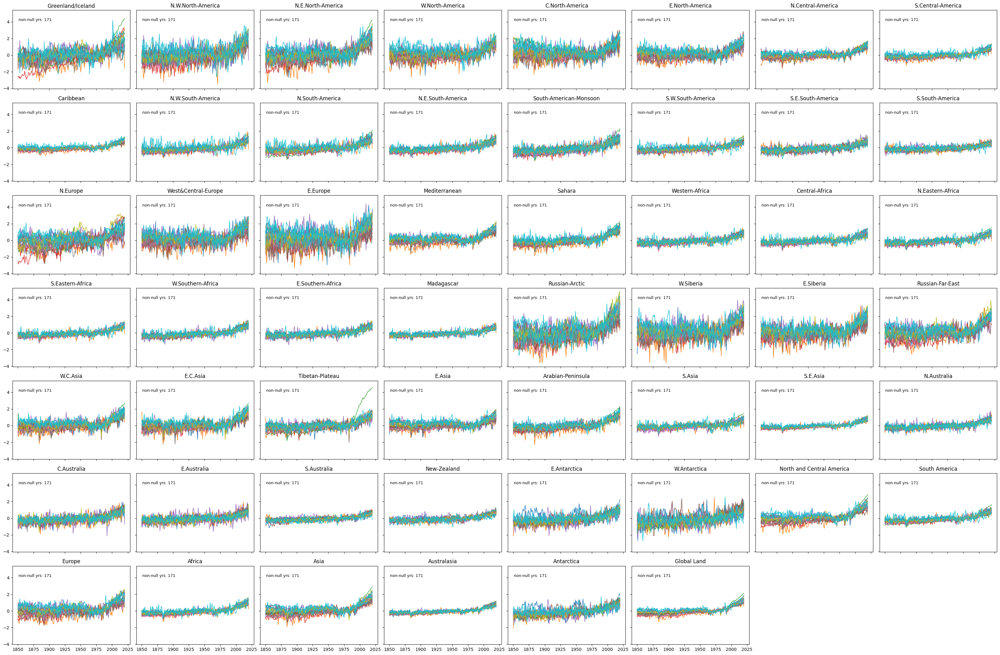

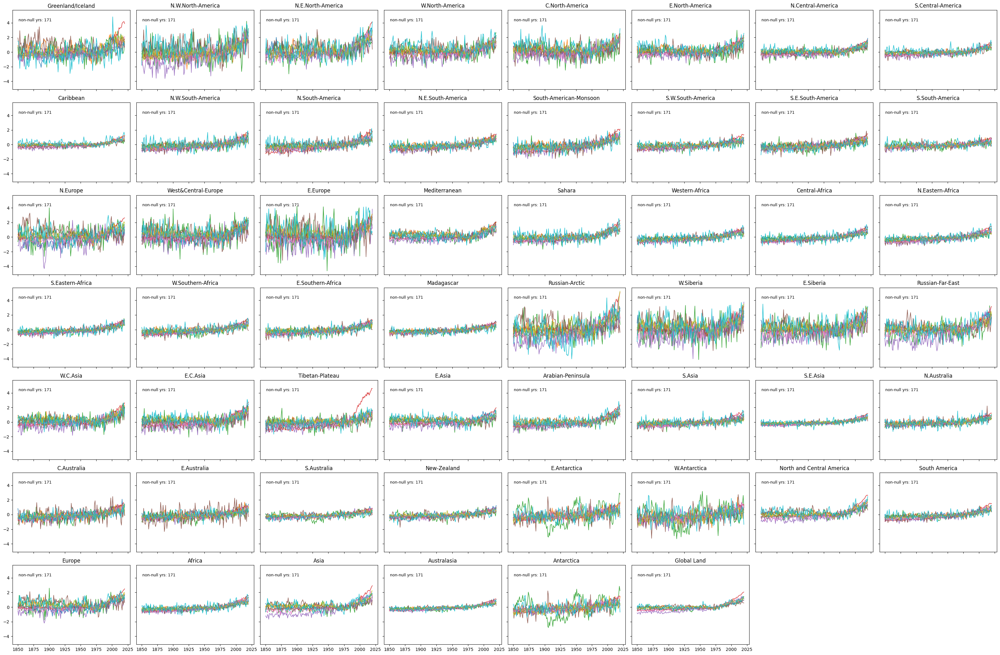

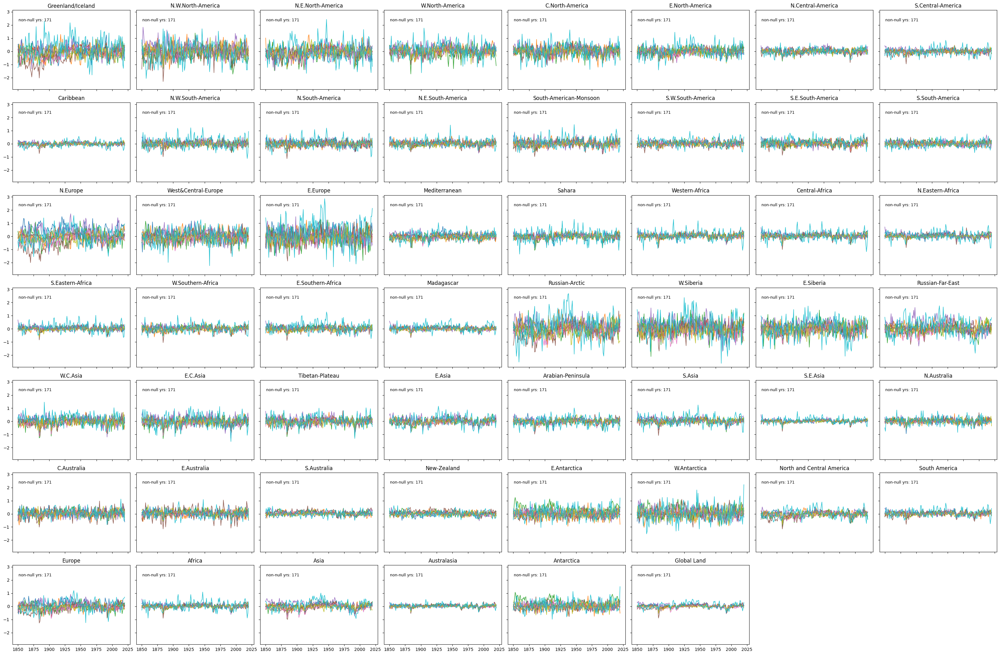

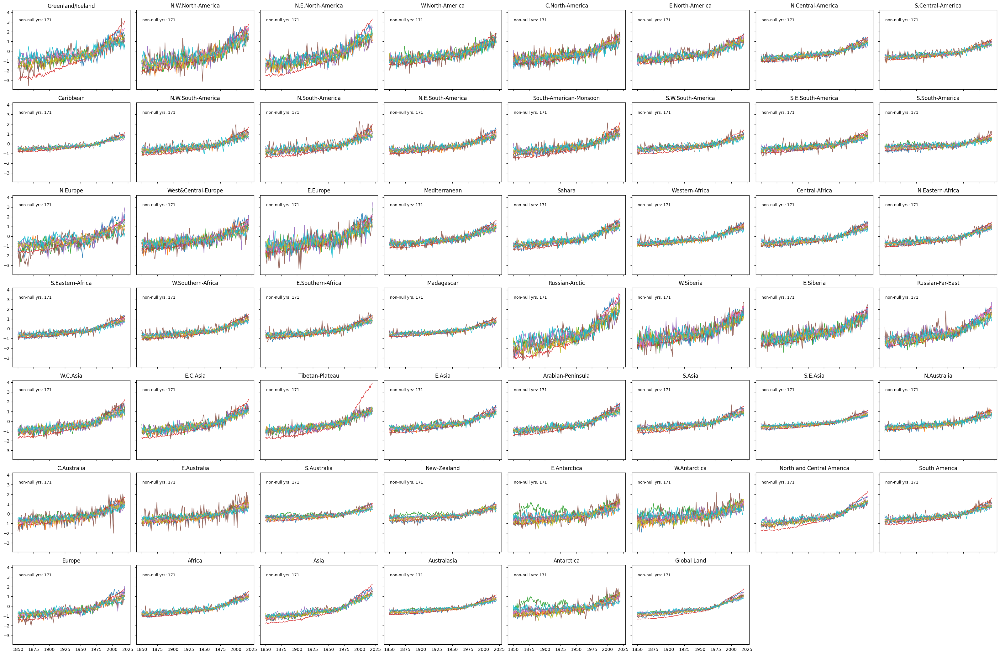

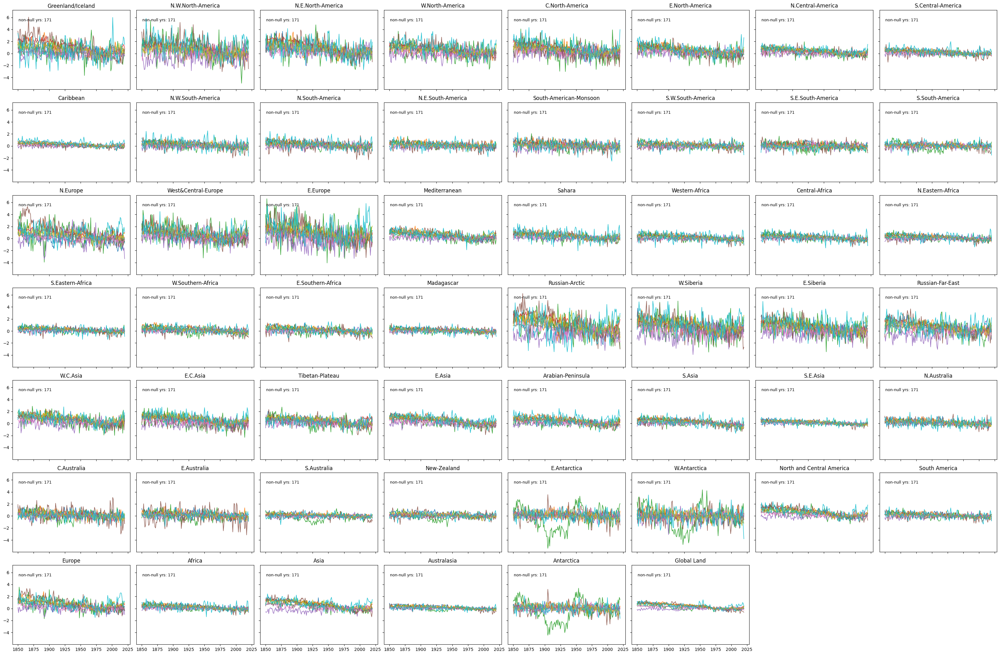

In [13]:

region_names = mod_his_all_ar6_cont_global.coords['names'].values

plot_regional_timeseries_multimodel(mod_his_all_ar6_cont_global, region_names = region_names)
plt.show()

for i in range(len(mod_ind_forcing_ar6_cont_global['forcing'])):
    plot_regional_timeseries_multimodel(mod_ind_forcing_ar6_cont_global[i], region_names = region_names)
    plt.show()

### 15 models with more than 3 runs, save as pseudo-obs

In [14]:
mo_his_2025 = mod_all.sel(year = slice(1850, 2025))


# Step 1: Count number of runs per model
counts = mo_his_2025.groupby("model_name").count("model_run")
# # Step 2: Select only models with > 3 runs
models_gt3 = counts.where(counts >= 3, drop=True).model_name.values
models_gt3

# Step 3: For each model, keep only the first 3 runs
selected = []
for m in models_gt3:
    # mask runs where model_name == m
    mask = mo_his_2025.model_name == m
    runs = mo_his_2025.sel(model_run=mo_his_2025.model_run[mask][:3])  # first 3 runs
    selected.append(runs)

# combine back
mo_his_2025_sel = xr.concat(selected, dim="model_run")

## Calculate AR6, continent, global mean
pseudo_45_ar6_cont_global = mod_runs_ar6_cont_glob_cal(mo_his_2025_sel)


name = '0.5.pseudo-model.15mod.run1-3.nonmasked.Tas.anomalies.46AR6regions_7cont_1glob_176years_1850-2025.pkl'

with open(save_path + name, 'wb') as wi:
	pickle.dump(pseudo_45_ar6_cont_global, wi)


In [15]:
mod_25_warm = change_ref(mod_his_all_ar6_cont_global, 1850, 1900).sel(year = slice(1990, 2020)).mean('year')
pseudo_15_warm = change_ref(pseudo_45_ar6_cont_global, 1850, 1900).sel(year = slice(1990, 2020)).mean('year')

In [16]:
mod_25_warm

<xarray.DataArray 'tas' (model_name: 25, region: 54)> Size: 11kB
array([[1.2280949 , 0.96875062, 1.15095049, ..., 0.71657736, 0.93622889,
        0.82794773],
       [1.45636771, 1.33470901, 1.28284019, ..., 0.60925993, 0.79443611,
        0.82360844],
       [1.35248176, 1.11412521, 1.77360023, ..., 0.59422264, 0.39282875,
        0.84612706],
       ...,
       [1.07095186, 0.9403129 , 1.39009972, ..., 0.56654783, 0.41152297,
        0.71107579],
       [1.1442609 , 0.6727683 , 1.47351409, ..., 0.55450347, 0.61461236,
        0.71884253],
       [1.52931667, 0.9127722 , 0.95421501, ..., 0.63832812, 1.10743228,
        0.72866318]], shape=(25, 54))
Coordinates:
  * model_name  (model_name) object 200B 'ACCESS-CM2' ... 'UKESM1-0-LL'
  * region      (region) int64 432B 0 1 2 3 4 5 6 7 ... 46 47 48 49 50 51 52 53
    abbrevs     (region) <U4 864B 'GIC' 'NWN' 'NEN' 'WNA' ... 'AU' 'ANT' 'LSAT'
    names       (region) <U25 5kB 'Greenland/Iceland' ... 'Global Land'

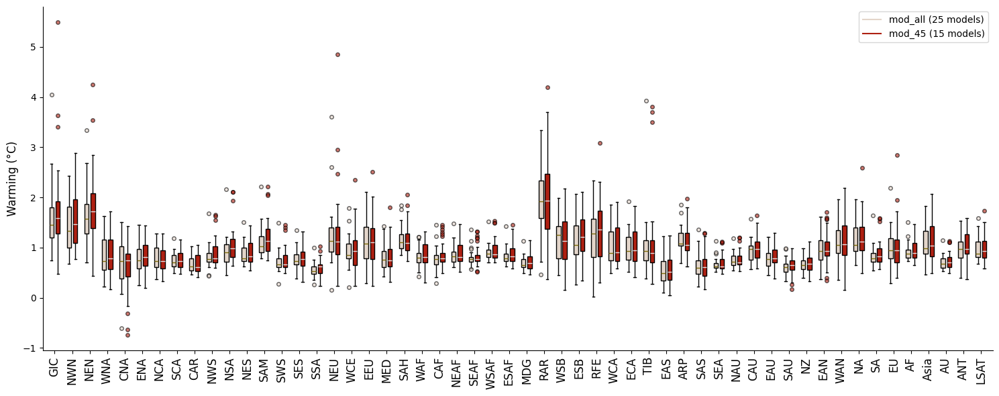

In [17]:

import matplotlib.pyplot as plt
import numpy as np

regions = mod_25_warm.region.values
n_regions = len(regions)

# Convert to list of arrays per region
data1 = [mod_25_warm.isel(region=i).values for i in range(n_regions)]
data2 = [pseudo_15_warm.isel(region=i).values for i in range(n_regions)]

fig, ax = plt.subplots(figsize=(15,6))

positions1 = np.arange(n_regions) - 0.18  # shift left
positions2 = np.arange(n_regions) + 0.18  # shift right


# Boxplot for mod_all (25)
bp1 = ax.boxplot(
    data1,
    positions=positions1,
    widths=0.25,
    patch_artist=True,
    boxprops=dict(facecolor="#e3d5ca"),
    medianprops=dict(color="#7c6a0a"),
    flierprops=dict(marker='o', markerfacecolor='#e3d5ca', markersize=4, alpha=0.6)  # outliers blue
)

# Boxplot for mod_45 (45)
bp2 = ax.boxplot(
    data2,
    positions=positions2,
    widths=0.25,
    patch_artist=True,
    boxprops=dict(facecolor="#ae2012"),
    medianprops=dict(color="#e5e5e5"),
    flierprops=dict(marker='o', markerfacecolor='#ae2012', markersize=4, alpha=0.6)  # outliers red squares
)


ax.set_xticks(np.arange(n_regions))
ax.set_xticklabels(mod_25_warm.abbrevs.values, rotation=90, fontsize=12)

ax.set_ylabel("Warming (°C)", fontsize=12)
# ax.set_title("Comparison of Warming Distributions between 25 models and 15 models (3 runs mean)", fontsize=12)

# Add legend manually
ax.plot([], c="#e3d5ca", label="mod_all (25 models)")
ax.plot([], c="#ae2012", label="mod_45 (15 models)")
ax.legend()

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.tight_layout()
plt.show()